## Most parts of this notebook are **identical** to:
    - scripts/evaluate_change_it_3d.py
    - evaluation/all_metrics.py

In [ ]:
from google.colab import drive
#drive.mount('/content/drive')
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
!git clone https://github.com/optas/changeit3d
%cd changeit3d
!git submodule add https://github.com/ThibaultGROUEIX/ChamferDistancePytorch changeit3d/losses/ChamferDistancePytorch
!pip install -e .
!pip install Ninja
!pip install wandb

Cloning into 'changeit3d'...
remote: Enumerating objects: 184, done.
remote: Counting objects: 100% (184/184), done.
remote: Compressing objects: 100% (164/164), done.
remote: Total 184 (delta 12), reused 184 (delta 12), pack-reused 0
Receiving objects: 100% (184/184), 4.28 MiB | 20.08 MiB/s, done.
Resolving deltas: 100% (12/12), done.
/content/changeit3d
Cloning into '/content/changeit3d/changeit3d/losses/ChamferDistancePytorch'...
remote: Enumerating objects: 265, done.
remote: Total 265 (delta 0), reused 0 (delta 0), pack-reused 265
Receiving objects: 100% (265/265), 46.75 KiB | 2.75 MiB/s, done.
Resolving deltas: 100% (163/163), done.
Obtaining file:///content/changeit3d
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 57.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 19.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 22.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import sys
sys.path.append('/content/drive/Shareddrives/CS766/changeit3d')

In [ ]:
import torch
import numpy as np
import os.path as osp
from functools import partial

from changeit3d.in_out.changeit3d_net import prepare_input_data
from changeit3d.in_out.language_contrastive_dataset import LanguageContrastiveDataset
from changeit3d.in_out.pointcloud import pc_loader_from_npz, uniform_subsample
from changeit3d.in_out.basics import pickle_data
from changeit3d.in_out.basics import create_logger
from changeit3d.in_out.arguments import parse_evaluate_changeit3d_arguments

from changeit3d.utils.basics import parallel_apply
from changeit3d.models.model_descriptions import load_pretrained_changeit3d_net
from changeit3d.models.model_descriptions import load_pretrained_pc_ae

from changeit3d.evaluation.auxiliary import pc_ae_transform_point_clouds, sgf_transform_point_clouds
from changeit3d.external_tools.sgf.loader import initialize_and_load_sgf
from changeit3d.utils.visualization import visualize_point_clouds_3d_v2, plot_3d_point_cloud


%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [ ]:
##
## Manually specify the underlying files using our pretrained nets or yours
## COMPLETE - UPDATED WITH MY FILE PATHS
##

#shape_generator_type = "sgf"
shape_generator_type = "pcae"
#shape_generator_type = "resnet101"

top_data_dir = '../drive/Shareddrives/CS766/shapetalk_dataset'
top_train_dir = '../drive/Shareddrives/CS766/pretrained_models/data'
shape_talk_file = f'{top_data_dir}/shapetalk/language/shapetalk_preprocessed_public_version_0.csv'
vocab_file = f'{top_data_dir}/shapetalk/language/vocabulary.pkl'
top_pc_dir = f'{top_data_dir}/shapetalk/point_clouds/scaled_to_align_rendering'
pretrained_oracle_listener = f'{top_train_dir}/pretrained/listeners/oracle_listener/all_shapetalk_classes/rs_2023/listener_dgcnn_based/ablation1/best_model.pkl'
pretrained_shape_classifier =  f'{top_train_dir}/pretrained/pc_classifiers/rs_2022/all_shapetalk_classes/best_model.pkl'
shape_part_classifiers_top_dir = f'{top_train_dir}/pretrained/part_predictors/shapenet_core_based'
latent_codes_file = f'{top_train_dir}/pretrained/shape_latents/{shape_generator_type}_latent_codes.pkl'


### PC-AE based:
if shape_generator_type == "pcae":
    pretrained_shape_generator = f'{top_train_dir}/pretrained/pc_autoencoders/pointnet/rs_2022/points_4096/all_classes/scaled_to_align_rendering/08-07-2022-22-23-42/best_model.pt'
    ## selected PC-AE ablation:
    selected_ablation = 'decoupling_mag_direction/idpen_0.05_sc_True/' # decoupled and with self-contrast=True

### SGF-AE based:
if shape_generator_type == "sgf":
    selected_ablation = 'decoupling_mag_direction/idpen_0.05_sc_True/'
    sub_sample_dataset = '100' # just evaluate over 100 randomly selected test shapes

pretrained_changeit3d = f'{top_train_dir}/pretrained/changers/{shape_generator_type}_based/all_shapetalk_classes/{selected_ablation}/best_model.pt'

In [ ]:


shape_generator_type = "sgf"

top_data_dir = '../../data'
shape_talk_file = f'{top_data_dir}/shapetalk/language/shapetalk_preprocessed_public_version_0.csv'
vocab_file = f'{top_data_dir}/shapetalk/language/vocabulary.pkl'
top_pc_dir = f'{top_data_dir}/shapetalk/point_clouds/scaled_to_align_rendering'
pretrained_oracle_listener = f'{top_data_dir}/pretrained/listeners/oracle_listener/all_shapetalk_classes/rs_2023/listener_dgcnn_based/ablation1/best_model.pkl'
pretrained_shape_classifier =  f'{top_data_dir}/pretrained/pc_classifiers/rs_2022/all_shapetalk_classes/best_model.pkl'
shape_part_classifiers_top_dir = f'{top_data_dir}/pretrained/part_predictors/shapenet_core_based'
latent_codes_file = f'{top_data_dir}/pretrained/shape_latents/{shape_generator_type}_latent_codes.pkl'


### PC-AE based:
if shape_generator_type == "pcae":
    pretrained_shape_generator = f'{top_data_dir}/pretrained/pc_autoencoders/pointnet/rs_2022/points_4096/all_classes/scaled_to_align_rendering/08-07-2022-22-23-42/best_model.pt'
    ## selected PC-AE ablation:
    selected_ablation = 'decoupling_mag_direction/idpen_0.05_sc_True/' # decoupled and with self-contrast=True

### SGF-AE based:
if shape_generator_type == "sgf":
    selected_ablation = 'decoupling_mag_direction/idpen_0.05_sc_True/'
    sub_sample_dataset = '100' # just evaluate over 100 randomly selected test shapes

pretrained_changeit3d = f'{top_data_dir}/pretrained/changers/{shape_generator_type}_based/all_shapetalk_classes/{selected_ablation}/best_model.pt'

In [ ]:

### Note book arguments to execute the code. ###
notebook_arguments = []

notebook_arguments.extend(['-shape_talk_file', shape_talk_file])
notebook_arguments.extend(['-latent_codes_file', latent_codes_file])
notebook_arguments.extend(['-vocab_file', vocab_file])
notebook_arguments.extend(['-pretrained_changeit3d', pretrained_changeit3d])
notebook_arguments.extend(['-top_pc_dir', top_pc_dir])
notebook_arguments.extend(['--shape_generator_type', shape_generator_type])
notebook_arguments.extend(['--pretrained_oracle_listener', pretrained_oracle_listener])
notebook_arguments.extend(['--pretrained_shape_classifier', pretrained_shape_classifier])
notebook_arguments.extend(['--shape_part_classifiers_top_dir', shape_part_classifiers_top_dir])

if 'pretrained_shape_generator' in  locals():
    notebook_arguments.extend(['--pretrained_shape_generator', pretrained_shape_generator])

if 'sub_sample_dataset' in  locals():
    notebook_arguments.extend(['--sub_sample_dataset', sub_sample_dataset])


args = parse_evaluate_changeit3d_arguments(notebook_arguments)
logger = create_logger(args.log_dir)



Input arguments:


{'batch_size': 1024,
 'clean_train_val_data': False,
 'compute_fpd': True,
 'evaluate_retrieval_version': False,
 'experiment_tag': None,
 'gpu_id': 0,
 'latent_codes_file': '../drive/Shareddrives/CS766/pretrained_models/data/pretrained/shape_latents/pcae_latent_codes.pkl',
 'log_dir': './logs',
 'n_sample_points': 2048,
 'num_workers': 10,
 'pretrained_changeit3d': '../drive/Shareddrives/CS766/pretrained_models/data/pretrained/changers/pcae_based/all_shapetalk_classes/decoupling_mag_direction/idpen_0.05_sc_True//best_model.pt',
 'pretrained_oracle_listener': '../drive/Shareddrives/CS766/pretrained_models/data/pretrained/listeners/oracle_listener/all_shapetalk_classes/rs_2023/listener_dgcnn_based/ablation1/best_model.pkl',
 'pretrained_shape_classifier': '../drive/Shareddrives/CS766/pretrained_models/data/pretrained/pc_classifiers/rs_2022/all_shapetalk_classes/best_model.pkl',
 'pretrained_shape_generator': '../drive/Shareddrives/CS766/pretrained_models/data/pretra

In [ ]:
print(args)

Namespace(shape_talk_file='../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/language/shapetalk_preprocessed_public_version_0.csv', vocab_file='../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/language/vocabulary.pkl', latent_codes_file='../drive/Shareddrives/CS766/pretrained_models/data/pretrained/shape_latents/pcae_latent_codes.pkl', pretrained_changeit3d='../drive/Shareddrives/CS766/pretrained_models/data/pretrained/changers/pcae_based/all_shapetalk_classes/decoupling_mag_direction/idpen_0.05_sc_True//best_model.pt', top_pc_dir='../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/point_clouds/scaled_to_align_rendering', restrict_shape_class=['chair', 'table', 'lamp'], pretrained_shape_classifier='../drive/Shareddrives/CS766/pretrained_models/data/pretrained/pc_classifiers/rs_2022/all_shapetalk_classes/best_model.pkl', compute_fpd=True, shape_part_classifiers_top_dir='../drive/Shareddrives/CS766/pretrained_models/data/pretrained/part_predictors/shapenet_core_based', 

In [ ]:
args.restrict_shape_class = ['lamp', 'vase', 'mug', 'bottle']

In [ ]:
args.restrict_shape_class = ['lamp']

In [ ]:
args.restrict_shape_class = ['chair']

In [ ]:
args.restrict_shape_class = ['lamp', 'chair']

In [ ]:
##
# Prepare the input data
##
df, shape_to_latent_code, shape_latent_dim, vocab = prepare_input_data(args, logger)

##
# Prepare the data loaders
##
def to_stimulus_func(x):
    return shape_to_latent_code[x]

split = 'test'
ndf = df[df.changeit_split == split].copy()
ndf.reset_index(inplace=True, drop=True)

if args.sub_sample_dataset is not None:
    np.random.seed(args.random_seed)
    ndf = ndf.sample(args.sub_sample_dataset)
    ndf.reset_index(inplace=True, drop=True)

dataset = LanguageContrastiveDataset(ndf,
                                     to_stimulus_func,
                                     n_distractors=1,
                                     shuffle_items=False)  # important, source (distractor) now is first

dataloader = torch.utils.data.DataLoader(dataset=dataset,
                                         batch_size=args.batch_size,
                                         shuffle=False,
                                         num_workers=args.num_workers,
                                         worker_init_fn=lambda _ : np.random.seed(args.random_seed))

INFO:root:Latent codes with dimension 256 are loaded.


Latent codes with dimension 256 are loaded.
Latent codes with dimension 256 are loaded.
Latent codes with dimension 256 are loaded.
Latent codes with dimension 256 are loaded.


INFO:root:Restricting to class(es) ['chair']. Total utterances: 74812


Restricting to class(es) ['chair']. Total utterances: 74812
Restricting to class(es) ['chair']. Total utterances: 74812
Restricting to class(es) ['chair']. Total utterances: 74812
Restricting to class(es) ['chair']. Total utterances: 74812


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 10 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
##
# Loading pretrained ChangetIt3DNet.   Please update the .config file to point to the directory YOU saved/downloaded this network.
##
logger.info('Loading pretrained ChangetIt3DNet (C3DNet)')
c3d_net, best_epoch, c3d_args = load_pretrained_changeit3d_net(args.pretrained_changeit3d, shape_latent_dim, vocab)
device = torch.device("cuda:" + str(args.gpu_id))
c3d_net = c3d_net.to(device)
logger.info(f'The model is variant `{c3d_args.shape_editor_variant}` trained with {c3d_args.identity_penalty} identity penalty and Self-Contrast={c3d_args.self_contrast}.')
logger.info(f'Loaded at epoch {best_epoch}.')


INFO:root:Loading pretrained ChangetIt3DNet (C3DNet)


Loading pretrained ChangetIt3DNet (C3DNet)
Loading pretrained ChangetIt3DNet (C3DNet)
Loading pretrained ChangetIt3DNet (C3DNet)
Loading pretrained ChangetIt3DNet (C3DNet)


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:286: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.self_attn.batch_first was not True(use batch_first for better inference performance)
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")
INFO:root:The model is variant `decoupling_mag_direction` trained with 0.05 identity penalty and Self-Contrast=True.


Doing ST ablation decoupling_mag_direction with self contrast True
The model is variant `decoupling_mag_direction` trained with 0.05 identity penalty and Self-Contrast=True.
The model is variant `decoupling_mag_direction` trained with 0.05 identity penalty and Self-Contrast=True.
The model is variant `decoupling_mag_direction` trained with 0.05 identity penalty and Self-Contrast=True.
The model is variant `decoupling_mag_direction` trained with 0.05 identity penalty and Self-Contrast=True.


INFO:root:Loaded at epoch 77.


Loaded at epoch 77.
Loaded at epoch 77.
Loaded at epoch 77.
Loaded at epoch 77.


In [ ]:
##
# Loading pretrained Shape Generator (AutoEncoder).
##
if args.shape_generator_type == 'pcae':
    pc_ae, pc_ae_args = load_pretrained_pc_ae(args.pretrained_shape_generator)
    pc_ae = pc_ae.to(device)
    pc_ae = pc_ae.eval()
elif args.shape_generator_type == 'sgf':
    sgf_ae = initialize_and_load_sgf()
    sgf_trainer = sgf_ae.trainer
    sgf_trainer.cfg.inference.num_points = args.n_sample_points
else:
    assert False

Pretrained PC-AE is loaded at epoch 186.


/content/changeit3d/changeit3d/models/model_descriptions.py:52: UserWarning: The saved best_model.pt in the corresponding log_dir is not equal to the one requested.
  warnings.warn("The saved best_model.pt in the corresponding log_dir is not equal to the one requested.")


In [ ]:
check_loader = dataloader
gt_classes = check_loader.dataset.df.source_object_class

# Decode edits
if args.shape_generator_type == 'pcae':
    transformation_results = pc_ae_transform_point_clouds(pc_ae,
                                                          c3d_net,
                                                          check_loader,
                                                          stimulus_index=0,
                                                          scales=[0, 1],  # use "0" to get also the simple reconstruction of the decoder (no edit)
                                                          device=device)

elif args.shape_generator_type == 'sgf':
    transformation_results = sgf_transform_point_clouds(sgf_trainer,
                                                        c3d_net,
                                                        check_loader,
                                                        stimulus_index=0,
                                                        scales=[1],
                                                        n_points_per_shape=args.n_sample_points,
                                                        batch_size=128,
                                                        max_recon_batches=None)

In [ ]:
transformed_shapes = transformation_results['recons'][1]
language_used = [vocab.decode_print(s) for s in transformation_results['tokens']]
gt_pc_files = check_loader.dataset.df.source_uid.apply(lambda x: osp.join(args.top_pc_dir, x + ".npz")).tolist()

if args.save_reconstructions:
    outputs = dict()
    outputs['transformed_shapes'] = transformed_shapes
    outputs['language_used'] = language_used
    outputs['gt_input_pc_files'] = gt_pc_files
    pickle_data(osp.join(args.log_dir, 'evaluation_outputs.pkl'), outputs)

In [ ]:
## Sample point-clouds to desired granularity for evaluation
if transformed_shapes.shape[-2] != args.n_sample_points:
    transformed_shapes = np.array([uniform_subsample(s, args.n_sample_points, args.random_seed)[0] for s in transformed_shapes])

## Load ground-truth input point-clouds
pc_loader =  partial(pc_loader_from_npz, n_samples=args.n_sample_points, random_seed=args.random_seed)
#gt_pcs = parallel_apply(gt_pc_files, pc_loader, n_processes=20)
gt_pcs = [pc_loader(m) for m in gt_pc_files]
gt_pcs = np.array(gt_pcs)

sentences = ndf.utterance_spelled.values
gt_classes = gt_classes.values

In [ ]:
print(args.random_seed)
print(args.n_sample_points)
print(len(gt_pc_files))
print(gt_pc_files)
print(gt_pcs.shape)

2022
2048
7540
['../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/point_clouds/scaled_to_align_rendering/chair/ShapeNet/4bbd110ccfc81dd336b0f2a1430e993a.npz', '../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/point_clouds/scaled_to_align_rendering/chair/ShapeNet/b60eb72661b2e56f7445d25f394949d0.npz', '../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/point_clouds/scaled_to_align_rendering/chair/ShapeNet/bb4868c1026c04fd7df0e9a69c97c97d.npz', '../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/point_clouds/scaled_to_align_rendering/chair/ShapeNet/436ed3a8e05baa0d492d9da2668ec34c.npz', '../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/point_clouds/scaled_to_align_rendering/chair/ShapeNet/cc3d9160369d09845e61ef8e2af97499.npz', '../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/point_clouds/scaled_to_align_rendering/chair/ShapeNet/c9913221819588b519fb4103277a6b93.npz', '../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/point_clouds/scaled_to_alig

7540
3485


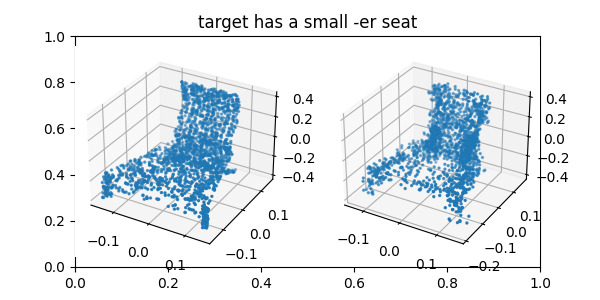

In [ ]:
print(len(transformed_shapes))
ridx = np.random.randint(len(transformed_shapes))
print(ridx)
vis_axis_order = [0, 2, 1]
visualize_point_clouds_3d_v2([gt_pcs[ridx], transformed_shapes[ridx]], fig_title=language_used[ridx])

In [ ]:
results_on_metrics = dict()

In [ ]:
print(results_on_metrics)

{}


Instead of running directly `run_all_metrics(transformed_shapes, gt_pcs, gt_classes, sentences, vocab, args, logger)`

Let's open-it-up.

In [ ]:
import torch
import numpy as np
import pandas as pd
import os.path as osp
from torch.utils.data import DataLoader
from collections import OrderedDict
from functools import partial

from changeit3d.in_out.pointcloud import (PointcloudDataset,
                                          swap_axes_of_pointcloud,
                                          center_in_unit_sphere)
from changeit3d.evaluation.generic_metrics import (chamfer_dists,
                                                   chamfer_dists_on_masked_pointclouds,
                                                   difference_in_probability,
                                                   get_clf_probabilities)
from changeit3d.evaluation.listening_based import listening_fit_on_raw_pcs
from changeit3d.evaluation.semantic_part_based import mark_part_reference_in_sentences, masks_of_referred_parts_for_pcs
from changeit3d.evaluation.fpd import calculate_fpd
from changeit3d.models.shape_part_segmentors import shape_net_parts_segmentor_inference, load_shape_net_parts_segmentor


network_input_transformations = dict()

## this is the transformation we use in our pretrained pc-based-classifier
## YOU MUST Change this accordingly if you use a different classifier
network_input_transformations['shape_classifier'] = partial(center_in_unit_sphere, in_place=False)

def pc_transform_for_part_predictor(pc):
    pc = swap_axes_of_pointcloud(pc, [0, 2, 1])
    pc = center_in_unit_sphere(pc)
    return pc

## this is the transformation we use in our pretrained part-predictor-classifier
## YOU MUST Change this accordingly if you use a different part-predictor
network_input_transformations['part_predictor'] = pc_transform_for_part_predictor

In [ ]:
#Prepare input for evaluation
gt_classes = pd.Series(gt_classes, name='shape_class')  #convert to pandas for ease of use via .groupby
tokens = pd.Series([sent.split() for sent in sentences])
max_len = tokens.apply(len).max()
tokens_encoded = np.stack(tokens.apply(lambda x: vocab.encode(x, max_len=max_len))) # encode to ints and put them in a N-shape array

In [ ]:
#############################################
# Test-1: Holistic (regular) Chamfer distance
#############################################
scale_chamfer_by = 1000
batch_size_for_cd = 2048
for cmp_with in [gt_pcs]:
    holistic_cd_mu, holistic_cds = chamfer_dists(cmp_with, transformed_shapes,
                                                bsize=min(len(transformed_shapes), batch_size_for_cd),
                                                device=device)
    torch.cuda.empty_cache()
    score = round(holistic_cd_mu * scale_chamfer_by, 3)
    score_per_class = (pd.concat([gt_classes, pd.DataFrame(holistic_cds.tolist())], axis=1).groupby('shape_class').mean()*scale_chamfer_by).round(3)
    score_per_class = score_per_class.reset_index().rename(columns={0: 'holistic-chamfer'})

    logger.info(f"Chamfer Distance (all pairs), Average: {score}")
    logger.info(f"Chamfer Distance (all pairs), Average, per class:")
    logger.info(score_per_class)

    results_on_metrics['Chamfer_all_pairs_average'] = score
    results_on_metrics['Chmafer_all_pairs_per_class'] = score_per_class

INFO:root:Chamfer Distance (all pairs), Average: 0.329


Chamfer Distance (all pairs), Average: 0.329
Chamfer Distance (all pairs), Average: 0.329
Chamfer Distance (all pairs), Average: 0.329
Chamfer Distance (all pairs), Average: 0.329


INFO:root:Chamfer Distance (all pairs), Average, per class:


Chamfer Distance (all pairs), Average, per class:
Chamfer Distance (all pairs), Average, per class:
Chamfer Distance (all pairs), Average, per class:
Chamfer Distance (all pairs), Average, per class:


INFO:root:  shape_class  holistic-chamfer
0       chair             0.329


  shape_class  holistic-chamfer
0       chair             0.329
  shape_class  holistic-chamfer
0       chair             0.329
  shape_class  holistic-chamfer
0       chair             0.329
  shape_class  holistic-chamfer
0       chair             0.329


In [ ]:
#############################################
# Test-2: LAB
#############################################
# Loading (optionally) a separately trained ORACLE neural listener, to be used for LAB measurements.
oracle_listener = None
if args.pretrained_oracle_listener:
    oracle_listener = torch.load(args.pretrained_oracle_listener).eval().to(device)
    _, all_boosts, avg_wins, avg_boost = listening_fit_on_raw_pcs(gt_pcs, transformed_shapes, tokens_encoded, oracle_listener, device=device)

    torch.cuda.empty_cache()
    logger.info(f"LAB Average:{avg_boost}")
    logger.info(f"LAB-related-metric: Times edit is favored by listener against the original input, Average:{avg_wins}")
    results_on_metrics['LAB_avg'] = avg_boost
    results_on_metrics['LAB_wins'] = avg_wins

    score_per_class = (pd.concat([gt_classes, pd.DataFrame(all_boosts.tolist())], axis=1).groupby('shape_class').mean())
    score_per_class = score_per_class.reset_index().rename(columns={0:'LAB'})
    logger.info(f"LAB (all pairs), Average, per class:")
    logger.info(score_per_class)

    results_on_metrics['LAB_per_class'] = score_per_class

INFO:root:LAB Average:0.5284350514411926


LAB Average:0.5284350514411926
LAB Average:0.5284350514411926
LAB Average:0.5284350514411926
LAB Average:0.5284350514411926


INFO:root:LAB-related-metric: Times edit is favored by listener against the original input, Average:0.79


LAB-related-metric: Times edit is favored by listener against the original input, Average:0.79
LAB-related-metric: Times edit is favored by listener against the original input, Average:0.79
LAB-related-metric: Times edit is favored by listener against the original input, Average:0.79
LAB-related-metric: Times edit is favored by listener against the original input, Average:0.79


INFO:root:LAB (all pairs), Average, per class:


LAB (all pairs), Average, per class:
LAB (all pairs), Average, per class:
LAB (all pairs), Average, per class:
LAB (all pairs), Average, per class:


INFO:root:  shape_class       LAB
0       chair  0.539279
1        lamp  0.506419


  shape_class       LAB
0       chair  0.539279
1        lamp  0.506419
  shape_class       LAB
0       chair  0.539279
1        lamp  0.506419
  shape_class       LAB
0       chair  0.539279
1        lamp  0.506419
  shape_class       LAB
0       chair  0.539279
1        lamp  0.506419


In [ ]:
!kill -15 7776

/bin/bash: line 1: kill: (7776) - No such process


In [ ]:
### Visualize a sample of case where the oracle considers the transformation *LESS* compatible than the input.
print(len(all_boosts))
ridx = np.random.choice(np.arange(len(all_boosts))[all_boosts<0])
print(ridx)
print(language_used[ridx])
visualize_point_clouds_3d_v2([gt_pcs[ridx], transformed_shapes[ridx]], fig_title=language_used[ridx])

NameError: name 'all_boosts' is not defined

- 1. Read the point cloud (N x 3)
- 2. Read the segmentation model (load_shape_net_parts_segmenter)
- 3. Extract a classification for every point PS_MAT = (N x P) => (P represented number of parts)
- 4. Remove specific parts in the point cloud (PS_MAT == 0) (0 is the part id).
- 5. Display the point cloud with the removed part.

['4bbd110ccfc81dd336b0f2a1430e993a.npz', 'b60eb72661b2e56f7445d25f394949d0.npz', 'bb4868c1026c04fd7df0e9a69c97c97d.npz', '436ed3a8e05baa0d492d9da2668ec34c.npz', 'cc3d9160369d09845e61ef8e2af97499.npz', 'c9913221819588b519fb4103277a6b93.npz', 'fc0c6ce55282cb4dc8687ff9b0b4e4ac.npz', 'fe5310a3457bf0e5c4e8952b27b5f370.npz', '885bc048615523273eec26c23f5bc80b.npz', '1e304b967d5253d5dd079f8cece51712.npz', 'd5d4dfb9e6901b66a3f22b4b00de6dfb.npz', '9233077bbe6926c239465fa20b0ba7fb.npz', 'ae3b4195dfa9779f89e49c5729fd5d6c.npz', '85f4e9037425401a191c3762b497eca9.npz', 'chair_0420.npz', '4a0f1aa6a24c889dc2f927df125f5ce4.npz', 'df59c2ab638e5bf47c4b9c3e153dc1c0.npz', '619d9f32db0780187c34f3963ae12156.npz', '26da81dbdf7784dddb984b8f0550fcd4.npz', 'e56087cd55cce8b4f41a4361d0ca9bc8.npz', '72fd9c2f47db23987f377effd1f7ba9e.npz', '35053caa62eea36c116cc4e115d5fd2.npz', '8ddae5e2493ab76af91663a74ccd2338.npz', '38c67c695eb4cd819e179bac86183112.npz', '2025aa3a71f3c468d16ba2cb1292d98a.npz', '8c629a89e570c8776a9cd

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 10 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


SHAPE PRED PARTS!! (7540, 2048)
Folder '../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/point_clouds/scaled_to_align_rendering/segmented_chair' created successfully.
Folder '../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/point_clouds/scaled_to_align_rendering/segmented_chair/part_0_removed' created successfully.
Folder '../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/point_clouds/scaled_to_align_rendering/segmented_chair/part_1_removed' created successfully.
Folder '../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/point_clouds/scaled_to_align_rendering/segmented_chair/part_2_removed' created successfully.
Folder '../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/point_clouds/scaled_to_align_rendering/segmented_chair/part_3_removed' created successfully.


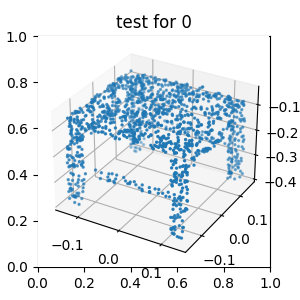

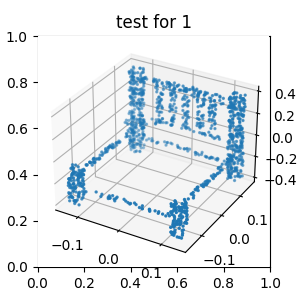

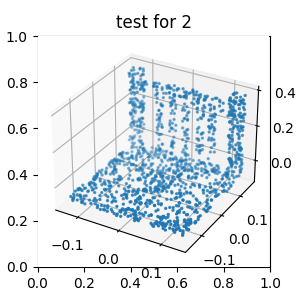

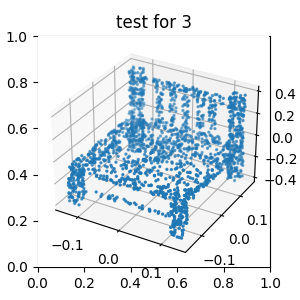

In [ ]:
# these were already defined/declared previously in the notebook! note I had set arg for class restrictions previously to lamp
# gt_pc_files # filepaths for each pointcloud (pc), in list format of length 100
# gt_pcs # actual point cloud coords shape is (100, 2048, 3)]

import os
filenames = [os.path.basename(m) for m in gt_pc_files]
filenames_no_ext = [os.path.splitext(name)[0] for name in filenames]
print(filenames)
print(filenames_no_ext)

#Update this to the desired class, engure we restricted args to this class previously
for shape_class in ['chair']:
  #load part segmenter
  file_location = osp.join(args.shape_part_classifiers_top_dir, f'best_seg_model_{shape_class}.pth')
  evaluating_part_predictor = load_shape_net_parts_segmentor(file_location, shape_class)
  evaluating_part_predictor = evaluating_part_predictor.to(device)

  idx_per_class = (gt_classes[gt_classes == shape_class].index).tolist()
  input_gt = gt_pcs[idx_per_class]

  #print(input_gt.shape)

  gt_loader = DataLoader(PointcloudDataset(input_gt, pc_transform=network_input_transformations['part_predictor']), batch_size=128, num_workers=10)

  # predict the parts of -all points in all shapes- coupled with lang for lamp this yields a value between 0-3
  pred_parts_gt = shape_net_parts_segmentor_inference(evaluating_part_predictor, gt_loader, device=device)
  #print("SHAPE PRED PARTS!!", pred_parts_gt.shape)

  parts = np.unique(pred_parts_gt)
  ignore_pc_by_part = []
  for part in range(len(parts)):
    ref_parts_idx = [[part] for _ in range(len(filenames))] #repurposing to just assume we mentioned the part for all files (iterating over each part so we segment all parts)
    # compute masks covering the points that belong to a referred part
    n_points = input_gt.shape[1]
    masks = np.ones((len(input_gt), n_points), dtype=bool)
    ignore_pc_generation_w_mask = []
    for i in range(pred_parts_gt.shape[0]):
      white_mask = np.ones(n_points, dtype=bool)
      white_mask &= pred_parts_gt[i] != part
      masks[i] = white_mask
      # check if mask is all true or all false aka all or none of the shape is that part
      msk_val = np.unique(masks[i])
      if len(msk_val) <= 1:
        ignore_pc_generation_w_mask.append(i)

    mask_gt = masks
    mask_gt_excluding = mask_gt.copy()
    mask_gt_excluding[ignore_pc_generation_w_mask] = np.ones_like(mask_gt_excluding[ignore_pc_generation_w_mask])
    ignore_pc_by_part.append(mask_gt_excluding)
    # generate cropped point clouds

    for j in range(input_gt.shape[0]):
      ridx = j
      cropped_pc = input_gt[ridx][ignore_pc_by_part[part][ridx]]
      #print(cropped_pc.shape)
      segmented_top_folder = f'{top_pc_dir}/segmented_{shape_class}'
      # define the folder path we want to save results to
      if not os.path.exists(segmented_top_folder):
        # Create the folder if it doesn't exist
        os.makedirs(segmented_top_folder)
        print(f"Folder '{segmented_top_folder}' created successfully.")
      segmented_sub_folder = f'{top_pc_dir}/segmented_{shape_class}/part_{part}_removed'
      if not os.path.exists(segmented_sub_folder):
        # Create the folder if it doesn't exist
        os.makedirs(segmented_sub_folder)
        print(f"Folder '{segmented_sub_folder}' created successfully.")
      save_file_name = f'part_{part}_removed_{filenames_no_ext[ridx]}.npz'
      full_new_file = os.path.join(segmented_sub_folder, save_file_name)
      np.savez(full_new_file, pointcloud=cropped_pc)


In [ ]:
ridx = 2
display(visualize_point_clouds_3d_v2([input_gt[ridx][ignore_pc_by_part[0][ridx]]],
                                     fig_title="test for 0"))
display(visualize_point_clouds_3d_v2([input_gt[ridx][ignore_pc_by_part[1][ridx]]],
                                     fig_title="test for 1"))
display(visualize_point_clouds_3d_v2([input_gt[ridx][ignore_pc_by_part[2][ridx]]],
                                     fig_title="test for 2"))
display(visualize_point_clouds_3d_v2([input_gt[ridx][ignore_pc_by_part[3][ridx]]],
                                     fig_title="test for 3"))

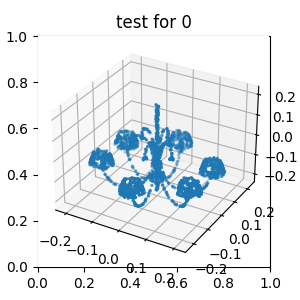

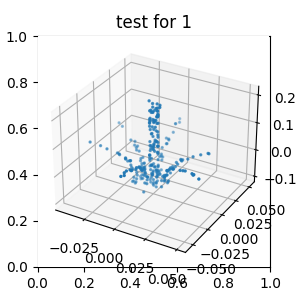

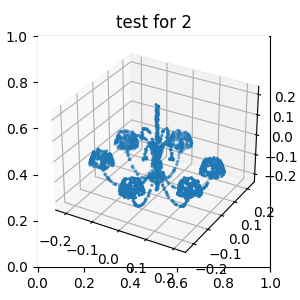

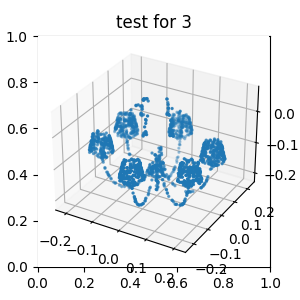

'acaf95927290a89182bfcd34215ccfc7.npz'

In [ ]:
ridx = 29
display(visualize_point_clouds_3d_v2([input_gt[ridx][ignore_pc_by_part[0][ridx]]],
                                     fig_title="test for 0"))
display(visualize_point_clouds_3d_v2([input_gt[ridx][ignore_pc_by_part[1][ridx]]],
                                     fig_title="test for 1"))
display(visualize_point_clouds_3d_v2([input_gt[ridx][ignore_pc_by_part[2][ridx]]],
                                     fig_title="test for 2"))
display(visualize_point_clouds_3d_v2([input_gt[ridx][ignore_pc_by_part[3][ridx]]],
                                     fig_title="test for 3"))
filenames[ridx]
# '../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/point_clouds/scaled_to_align_rendering/segmented_lamp/part_0_removed'



(2048, 3)


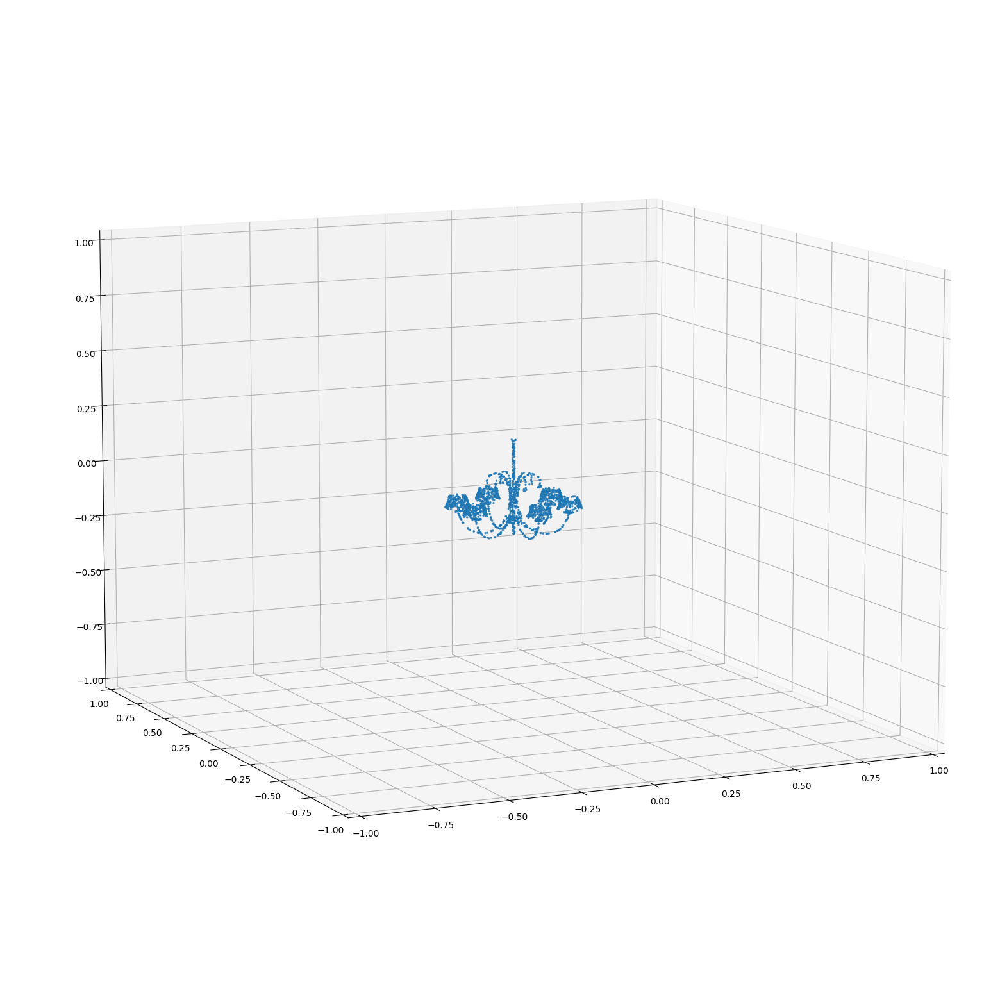

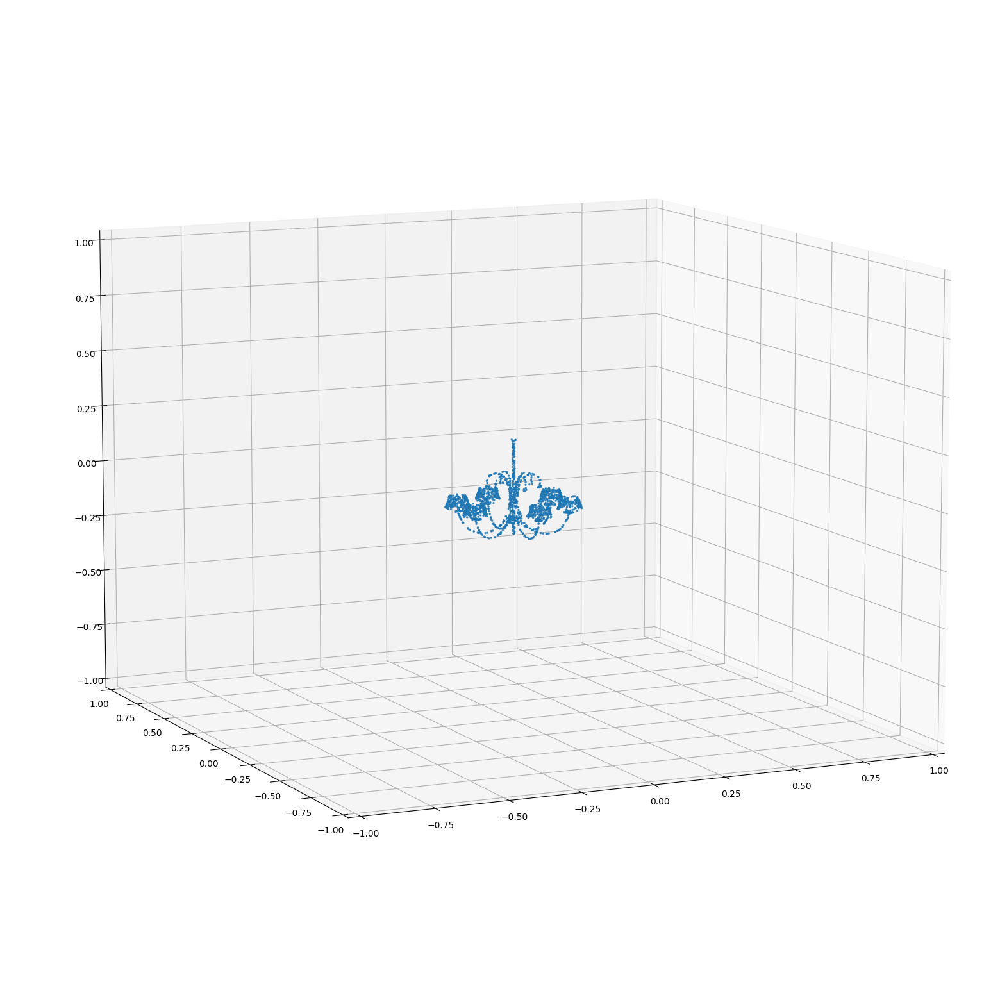

In [ ]:
pcfile = f'../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/point_clouds/scaled_to_align_rendering/segmented_chair/part_0_removed/part_0_removed_acaf95927290a89182bfcd34215ccfc7.npz'
pcdata = np.load(pcfile, allow_pickle=True)
mypc = pcdata['pointcloud']
print(mypc.shape)

#visualize_point_clouds_3d_v2(mypc)
plot_3d_point_cloud(mypc, figsize=(20, 20), set_lim=0.2, visualization_pc_axis=(0,2,1))

In [ ]:
print(gt_pc_files)
print(len(gt_pc_files))

['../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/point_clouds/scaled_to_align_rendering/lamp/ShapeNet/86f8f2c064c79e6cb0c0d433974e32b.npz', '../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/point_clouds/scaled_to_align_rendering/lamp/ShapeNet/8207274d3677061673ab7b7128d466a2.npz', '../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/point_clouds/scaled_to_align_rendering/lamp/ShapeNet/8207274d3677061673ab7b7128d466a2.npz', '../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/point_clouds/scaled_to_align_rendering/lamp/ShapeNet/366a93bce1f6f524eaf14273fa406ffc.npz', '../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/point_clouds/scaled_to_align_rendering/lamp/ShapeNet/366a93bce1f6f524eaf14273fa406ffc.npz', '../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/point_clouds/scaled_to_align_rendering/lamp/ShapeNet/74799fccd1636ce4df6cfab91d65bb91.npz', '../drive/Shareddrives/CS766/shapetalk_dataset/shapetalk/point_clouds/scaled_to_align_rendering/lamp/Shape

In [ ]:
import os

filenames = [os.path.basename(m) for m in gt_pc_files]
filenames_no_ext = [os.path.splitext(name)[0] for name in filenames]
print(filenames)
print(len(filenames_no_ext))
print(filenames_no_ext[3])

['86f8f2c064c79e6cb0c0d433974e32b.npz', '8207274d3677061673ab7b7128d466a2.npz', '8207274d3677061673ab7b7128d466a2.npz', '366a93bce1f6f524eaf14273fa406ffc.npz', '366a93bce1f6f524eaf14273fa406ffc.npz', '74799fccd1636ce4df6cfab91d65bb91.npz', '74799fccd1636ce4df6cfab91d65bb91.npz', '28210d460a79e323322123314d92e1d.npz', '28210d460a79e323322123314d92e1d.npz', 'f41fdea6ec38439193b00be700931140.npz', 'f41fdea6ec38439193b00be700931140.npz', '76eb7436c40e083384d184bdc625781a.npz', '76eb7436c40e083384d184bdc625781a.npz', 'b000d66b8f78ab20cfdfe3f21f42a111.npz', 'f0b19b0258e8f551d5cb6d178687b980.npz', '4d61bb37c5edb2903f7bd0762436c545.npz', '4d61bb37c5edb2903f7bd0762436c545.npz', '36d90198790ed82386052e834fbd2c4a.npz', '36d90198790ed82386052e834fbd2c4a.npz', '5eefe57de9ad8b6114038d588fd1342f.npz', '5eefe57de9ad8b6114038d588fd1342f.npz', '83353863ea1349682ebeb1e6a8111f53.npz', '83353863ea1349682ebeb1e6a8111f53.npz', '8a9f2e5b726ea37f60ad823977adaa23.npz', '8a9f2e5b726ea37f60ad823977adaa23.npz', '5

In [ ]:
#############################################
# Test-6: Part-Based (Localized) Metrics
#############################################

if args.shape_part_classifiers_top_dir:
    lgd_scores = dict()
    lgd_stats = dict()
    lgd_scores['without_parts_per_class'] = dict()
    lgd_scores['GD_on_pairs_with_parts_per_class'] = dict()
    lgd_scores['with_parts_per_class'] = dict()
    lgd_scores['with_parts_normalized_per_class'] = dict()

    for shape_class in ['chair']:  #LHR updated to lamp
        print("shape class:", shape_class)
        # Loading a part-clf to measure the localized-Geometric-Difference (l-GD) score
        file_location = osp.join(args.shape_part_classifiers_top_dir, f'best_seg_model_{shape_class}.pth')
        print("where is file:", file_location)
        evaluating_part_predictor = load_shape_net_parts_segmentor(file_location, shape_class)
        #print("evaluating part predictor: ", evaluating_part_predictor)
        evaluating_part_predictor = evaluating_part_predictor.to(device)

        idx_per_class = (gt_classes[gt_classes == shape_class].index).tolist()
        print("idx per class", idx_per_class)
        input_gt = gt_pcs[idx_per_class]  # getting a point cloud apparently 100 are loaded onto the device indecied 0-99
        #print("input_gt", input_gt)
        input_trans = transformed_shapes[idx_per_class] #getting another point cloud e.g. transformed shape like the target
        #print("input_trans", input_trans)

        gt_loader = DataLoader(PointcloudDataset(input_gt, pc_transform=network_input_transformations['part_predictor']), batch_size=128, num_workers=10)
        print("GT LOADER!: ", gt_loader)
        trans_loader = DataLoader(PointcloudDataset(input_trans, pc_transform=network_input_transformations['part_predictor']), batch_size=128, num_workers=10)

        # STEP-1 predict the parts of -all- shapes coupled with lang
        pred_parts_gt = shape_net_parts_segmentor_inference(evaluating_part_predictor, gt_loader, device=device)
        print("does this have a size that matches the point cloud with indicator or part type?")
        print("shape of pred_parts_g: ", pred_parts_gt.shape)
        print("this belongs to part index: ", max(pred_parts_gt[0]))
        print("input_gt shape:", input_gt.shape)

        pred_parts_trans = shape_net_parts_segmentor_inference(evaluating_part_predictor, trans_loader, device=device)

        ## Collect data about the predicted/referred part before computing LGD

        # STEP-2 find the actual references that do part-specific language to focus
        _, ref_parts_idx = mark_part_reference_in_sentences(tokens[idx_per_class], gt_classes[idx_per_class])
        #print("ref part idx: ", ref_parts_idx, "tokens[]: ", tokens[idx_per_class], "index per class?", idx_per_class)
        print("ref part idx: ", ref_parts_idx)
        print("length of ref part indexes:", len(ref_parts_idx))
        rows_to_part_idx = OrderedDict()
        print("rows to part index:", rows_to_part_idx)
        no_part_referred = []
        for i, v in enumerate(ref_parts_idx):
            if len(v) > 0:  # i.e., there is a part to be removed for this example
                rows_to_part_idx[i] = v
                print("for i: ", i, " what is v aka part to remove?: ",  v)
                print("_", _)
                #what is the filename of the point cloud...?
            else:
                no_part_referred.append(i)  # no part referred (so should be ignored from all localized-GD computations)

        # compute masks covering the points that belong to a referred part
        mask_gt = masks_of_referred_parts_for_pcs(input_gt, pred_parts_gt, rows_to_part_idx)
        mask_tr = masks_of_referred_parts_for_pcs(input_trans, pred_parts_trans, rows_to_part_idx)
        assert len(mask_gt) == len(mask_tr) & len(input_gt) == len(input_trans)

        # find shapes for which all points belong to the part(s), so the PC will be empty post its removal
        all_points_g = np.where((mask_gt == False).sum(1) == mask_gt.shape[1])[0]
        all_points_t = np.where((mask_tr == False).sum(1) == mask_tr.shape[1])[0]
        all_points = list(set(all_points_g).union(all_points_t))

        # Also find cases where the part-predictor did not find any point belonging to the referred parts in BOTH or EITHER source/target
        referred_part_not_predicted_at_all = []
        referred_part_not_predicted_in_one_of_them = []
        for i, p in enumerate(ref_parts_idx):
            pred_has_it = set(p) <= set(np.unique(pred_parts_gt[i]))
            gt_has_it = set(p) <= set(np.unique(pred_parts_trans[i]))

            if not pred_has_it and not gt_has_it:
                referred_part_not_predicted_at_all.append(i)
            if not pred_has_it or not gt_has_it:
                referred_part_not_predicted_in_one_of_them.append(i)

        ## OK - NOW:
        #
        # A. - let's compute localized measurements where **we exclude** the referred part

        # for this we should ignore CD on the following:
        ignore_excluding = no_part_referred                    # obvious
        ignore_excluding += all_points                         # if all points are assigned to referred parts the entire shape will be reduced to the empty set
        ignore_excluding += referred_part_not_predicted_at_all # the predictor did not find the part(s) in both of them, so there is nothing to exclude
        lgd_stats[f"{shape_class}_without_n_ignore"] = len(set(ignore_excluding))

        print("ignore_excluding:, ", ignore_excluding)
        print(len(ignore_excluding))

        ## let's put 1's on the masks of the above shape pairs to not have chamfer distance computation crash (we will ignore these results anyway post computation)
        mask_gt_excluding = mask_gt.copy()
        mask_tr_excluding = mask_tr.copy()
        mask_gt_excluding[ignore_excluding] = np.ones_like(mask_gt_excluding[ignore_excluding])
        mask_tr_excluding[ignore_excluding] = np.ones_like(mask_tr_excluding[ignore_excluding])

        # compute the cd on all points but the parts
        _, masked_cds = chamfer_dists_on_masked_pointclouds(input_gt, input_trans, mask_gt_excluding, mask_tr_excluding, bsize=2048, device=device)
        torch.cuda.empty_cache()
        masked_cd_mu = np.mean([mc for c, mc in enumerate(masked_cds) if c not in set(ignore_excluding)])
        score = round(masked_cd_mu * scale_chamfer_by, 3)

        lgd_scores['without_parts_per_class'][shape_class] = score
        logger.info(f'(l)-GD excluding part(s) ({shape_class}): {score}')

        # compute (again) the cd ignoring part masks altogether
        _, unmasked_cds = chamfer_dists(input_gt, input_trans, bsize=2048, device=device)
        score = np.mean([hc for c, hc in enumerate(unmasked_cds) if c not in set(ignore_excluding)])
        score = round(score * scale_chamfer_by, 3)
        logger.info(f'GD on entire shapes when both have predicted referred parts  ({shape_class}): {score}')

shape class: chair
where is file: ../drive/Shareddrives/CS766/pretrained_models/data/pretrained/part_predictors/shapenet_core_based/best_seg_model_chair.pth
idx per class [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 10 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


does this have a size that matches the point cloud with indicator or part type?
shape of pred_parts_g:  (7540, 2048)
this belongs to part index:  2
input_gt shape: (7540, 2048, 3)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 135  what is v aka part to remove?:  [3]
_ [set(), {'back'}, set(), set(), {'arm'}, set(), {'arm'}, set(), set(), set(), {'back'}, {'back'}, set(), {'seat'}, {'back'}, {'back'}, set(), set(), set(), set(), {'leg'}, {'back'}, {'back'}, set(), set(), set(), {'arm'}, set(), {'back'}, {'back'}, {'back'}, {'back'}, {'arm'}, set(), {'leg'}, {'back'}, {'seat'}, set(), {'back'}, {'arm'}, {'back'}, {'arm'}, set(), {'back'}, set(), {'back'}, set(), {'back'}, {'back'}, {'back', 'arm'}, {'arm'}, set(), set(), {'seat'}, set(), {'back'}, {'leg'}, {'seat'}, set(), {'back'}, {'arm'}, {'back'}, {'seat'}, set(), {'back'}, {'seat'}, {'arm'}, set(), {'back'}, set(), {'arm'}, {'back'}, {'leg'}, {'back'}, {'leg'}, {'back', 'arm'}, set(), {'arm'}, set(), {'arm'}, {'arm'}, set(), {'back'}, {'back'}, {'back'}, {'leg'}, set(), set(), {'arm'}, set(), set(), {'arm'}, set(), set(), set(), set(), {'back'}, {'back'}, set(), set(), set(), {'back'}, {'arm'}, {'back'}, {'seat'}, {'back'}, {'seat', 'arm'}, {'back'}, se

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



 2196  what is v aka part to remove?:  [1]
_ [set(), {'back'}, set(), set(), {'arm'}, set(), {'arm'}, set(), set(), set(), {'back'}, {'back'}, set(), {'seat'}, {'back'}, {'back'}, set(), set(), set(), set(), {'leg'}, {'back'}, {'back'}, set(), set(), set(), {'arm'}, set(), {'back'}, {'back'}, {'back'}, {'back'}, {'arm'}, set(), {'leg'}, {'back'}, {'seat'}, set(), {'back'}, {'arm'}, {'back'}, {'arm'}, set(), {'back'}, set(), {'back'}, set(), {'back'}, {'back'}, {'back', 'arm'}, {'arm'}, set(), set(), {'seat'}, set(), {'back'}, {'leg'}, {'seat'}, set(), {'back'}, {'arm'}, {'back'}, {'seat'}, set(), {'back'}, {'seat'}, {'arm'}, set(), {'back'}, set(), {'arm'}, {'back'}, {'leg'}, {'back'}, {'leg'}, {'back', 'arm'}, set(), {'arm'}, set(), {'arm'}, {'arm'}, set(), {'back'}, {'back'}, {'back'}, {'leg'}, set(), set(), {'arm'}, set(), set(), {'arm'}, set(), set(), set(), set(), {'back'}, {'back'}, set(), set(), set(), {'back'}, {'arm'}, {'back'}, {'seat'}, {'back'}, {'seat', 'arm'}, {'back'}, s

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




for i:  2718  what is v aka part to remove?:  [0]
_ [set(), {'back'}, set(), set(), {'arm'}, set(), {'arm'}, set(), set(), set(), {'back'}, {'back'}, set(), {'seat'}, {'back'}, {'back'}, set(), set(), set(), set(), {'leg'}, {'back'}, {'back'}, set(), set(), set(), {'arm'}, set(), {'back'}, {'back'}, {'back'}, {'back'}, {'arm'}, set(), {'leg'}, {'back'}, {'seat'}, set(), {'back'}, {'arm'}, {'back'}, {'arm'}, set(), {'back'}, set(), {'back'}, set(), {'back'}, {'back'}, {'back', 'arm'}, {'arm'}, set(), set(), {'seat'}, set(), {'back'}, {'leg'}, {'seat'}, set(), {'back'}, {'arm'}, {'back'}, {'seat'}, set(), {'back'}, {'seat'}, {'arm'}, set(), {'back'}, set(), {'arm'}, {'back'}, {'leg'}, {'back'}, {'leg'}, {'back', 'arm'}, set(), {'arm'}, set(), {'arm'}, {'arm'}, set(), {'back'}, {'back'}, {'back'}, {'leg'}, set(), set(), {'arm'}, set(), set(), {'arm'}, set(), set(), set(), set(), {'back'}, {'back'}, set(), set(), set(), {'back'}, {'arm'}, {'back'}, {'seat'}, {'back'}, {'seat', 'arm'}, {'b

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[set(), {'back'}, set(), set(), {'arm'}, set(), {'arm'}, set(), set(), set(), {'back'}, {'back'}, set(), {'seat'}, {'back'}, {'back'}, set(), set(), set(), set(), {'leg'}, {'back'}, {'back'}, set(), set(), set(), {'arm'}, set(), {'back'}, {'back'}, {'back'}, {'back'}, {'arm'}, set(), {'leg'}, {'back'}, {'seat'}, set(), {'back'}, {'arm'}, {'back'}, {'arm'}, set(), {'back'}, set(), {'back'}, set(), {'back'}, {'back'}, {'back', 'arm'}, {'arm'}, set(), set(), {'seat'}, set(), {'back'}, {'leg'}, {'seat'}, set(), {'back'}, {'arm'}, {'back'}, {'seat'}, set(), {'back'}, {'seat'}, {'arm'}, set(), {'back'}, set(), {'arm'}, {'back'}, {'leg'}, {'back'}, {'leg'}, {'back', 'arm'}, set(), {'arm'}, set(), {'arm'}, {'arm'}, set(), {'back'}, {'back'}, {'back'}, {'leg'}, set(), set(), {'arm'}, set(), set(), {'arm'}, set(), set(), set(), set(), {'back'}, {'back'}, set(), set(), set(), {'back'}, {'arm'}, {'back'}, {'seat'}, {'back'}, {'seat', 'arm'}, {'back'}, set(), {'seat'}, set(), {'back'}, set(), {'bac

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[set(), {'back'}, set(), set(), {'arm'}, set(), {'arm'}, set(), set(), set(), {'back'}, {'back'}, set(), {'seat'}, {'back'}, {'back'}, set(), set(), set(), set(), {'leg'}, {'back'}, {'back'}, set(), set(), set(), {'arm'}, set(), {'back'}, {'back'}, {'back'}, {'back'}, {'arm'}, set(), {'leg'}, {'back'}, {'seat'}, set(), {'back'}, {'arm'}, {'back'}, {'arm'}, set(), {'back'}, set(), {'back'}, set(), {'back'}, {'back'}, {'back', 'arm'}, {'arm'}, set(), set(), {'seat'}, set(), {'back'}, {'leg'}, {'seat'}, set(), {'back'}, {'arm'}, {'back'}, {'seat'}, set(), {'back'}, {'seat'}, {'arm'}, set(), {'back'}, set(), {'arm'}, {'back'}, {'leg'}, {'back'}, {'leg'}, {'back', 'arm'}, set(), {'arm'}, set(), {'arm'}, {'arm'}, set(), {'back'}, {'back'}, {'back'}, {'leg'}, set(), set(), {'arm'}, set(), set(), {'arm'}, set(), set(), set(), set(), {'back'}, {'back'}, set(), set(), set(), {'back'}, {'arm'}, {'back'}, {'seat'}, {'back'}, {'seat', 'arm'}, {'back'}, set(), {'seat'}, set(), {'back'}, set(), {'bac

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



_ [set(), {'back'}, set(), set(), {'arm'}, set(), {'arm'}, set(), set(), set(), {'back'}, {'back'}, set(), {'seat'}, {'back'}, {'back'}, set(), set(), set(), set(), {'leg'}, {'back'}, {'back'}, set(), set(), set(), {'arm'}, set(), {'back'}, {'back'}, {'back'}, {'back'}, {'arm'}, set(), {'leg'}, {'back'}, {'seat'}, set(), {'back'}, {'arm'}, {'back'}, {'arm'}, set(), {'back'}, set(), {'back'}, set(), {'back'}, {'back'}, {'back', 'arm'}, {'arm'}, set(), set(), {'seat'}, set(), {'back'}, {'leg'}, {'seat'}, set(), {'back'}, {'arm'}, {'back'}, {'seat'}, set(), {'back'}, {'seat'}, {'arm'}, set(), {'back'}, set(), {'arm'}, {'back'}, {'leg'}, {'back'}, {'leg'}, {'back', 'arm'}, set(), {'arm'}, set(), {'arm'}, {'arm'}, set(), {'back'}, {'back'}, {'back'}, {'leg'}, set(), set(), {'arm'}, set(), set(), {'arm'}, set(), set(), set(), set(), {'back'}, {'back'}, set(), set(), set(), {'back'}, {'arm'}, {'back'}, {'seat'}, {'back'}, {'seat', 'arm'}, {'back'}, set(), {'seat'}, set(), {'back'}, set(), {'b

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



ignore_excluding:,  [0, 2, 3, 5, 7, 8, 9, 12, 16, 17, 18, 19, 23, 24, 25, 27, 33, 37, 42, 44, 46, 51, 52, 54, 58, 63, 67, 69, 76, 78, 81, 86, 87, 89, 90, 92, 93, 94, 95, 98, 99, 100, 108, 110, 112, 116, 118, 120, 122, 126, 129, 130, 131, 136, 137, 139, 142, 143, 145, 146, 147, 152, 153, 154, 156, 160, 162, 163, 164, 165, 167, 169, 170, 172, 177, 178, 185, 187, 188, 189, 190, 192, 194, 198, 199, 202, 203, 206, 212, 213, 217, 219, 225, 227, 229, 231, 233, 241, 242, 243, 245, 250, 251, 255, 256, 257, 258, 266, 267, 269, 270, 277, 278, 281, 282, 283, 284, 285, 286, 287, 290, 294, 296, 297, 298, 301, 305, 307, 308, 309, 310, 315, 317, 318, 319, 320, 321, 322, 323, 326, 327, 332, 335, 337, 341, 342, 343, 344, 346, 352, 355, 356, 361, 362, 363, 365, 366, 368, 370, 375, 376, 381, 382, 383, 385, 386, 391, 393, 394, 395, 396, 397, 399, 400, 403, 404, 406, 407, 408, 409, 411, 412, 413, 415, 416, 419, 423, 427, 428, 433, 434, 435, 438, 440, 443, 445, 446, 448, 452, 454, 455, 456, 457, 460, 461, 46

INFO:root:(l)-GD excluding part(s) (chair): 0.574


(l)-GD excluding part(s) (chair): 0.574
(l)-GD excluding part(s) (chair): 0.574
(l)-GD excluding part(s) (chair): 0.574
(l)-GD excluding part(s) (chair): 0.574


INFO:root:GD on entire shapes when both have predicted referred parts  (chair): 0.342


GD on entire shapes when both have predicted referred parts  (chair): 0.342
GD on entire shapes when both have predicted referred parts  (chair): 0.342
GD on entire shapes when both have predicted referred parts  (chair): 0.342
GD on entire shapes when both have predicted referred parts  (chair): 0.342


In [ ]:
print(rows_to_part_idx)

OrderedDict([(0, [1]), (1, [0]), (3, [0]), (4, [3]), (6, [0]), (7, [1]), (8, [3]), (9, [0]), (12, [1]), (13, [0]), (16, [0]), (17, [1]), (21, [1]), (22, [1, 0]), (24, [1]), (28, [1]), (30, [0]), (31, [0]), (34, [1]), (35, [3]), (36, [0]), (39, [1]), (40, [3]), (44, [2]), (45, [1]), (46, [1]), (47, [0]), (50, [1, 0]), (52, [3]), (53, [0]), (57, [1]), (58, [0]), (59, [0]), (60, [0]), (61, [0]), (64, [1]), (68, [1]), (71, [1]), (74, [3]), (75, [0]), (80, [0]), (81, [1]), (83, [1]), (84, [0]), (85, [1]), (88, [0]), (92, [1]), (93, [1]), (96, [0])])


In [ ]:
print(rows_to_part_idx.items())

odict_items([(0, [1]), (1, [0]), (3, [0]), (4, [3]), (6, [0]), (7, [1]), (8, [3]), (9, [0]), (12, [1]), (13, [0]), (16, [0]), (17, [1]), (21, [1]), (22, [1, 0]), (24, [1]), (28, [1]), (30, [0]), (31, [0]), (34, [1]), (35, [3]), (36, [0]), (39, [1]), (40, [3]), (44, [2]), (45, [1]), (46, [1]), (47, [0]), (50, [1, 0]), (52, [3]), (53, [0]), (57, [1]), (58, [0]), (59, [0]), (60, [0]), (61, [0]), (64, [1]), (68, [1]), (71, [1]), (74, [3]), (75, [0]), (80, [0]), (81, [1]), (83, [1]), (84, [0]), (85, [1]), (88, [0]), (92, [1]), (93, [1]), (96, [0])])


parts are labeled 0, 1, 2, or 3
roughly shade, floor-base, body, canopy (not in this order)
The 100 files in this sample is based on gt_pc_files

In [ ]:
print(no_part_referred)

[2, 5, 10, 11, 14, 15, 18, 19, 20, 23, 25, 26, 27, 29, 32, 33, 37, 38, 41, 42, 43, 48, 49, 51, 54, 55, 56, 62, 63, 65, 66, 67, 69, 70, 72, 73, 76, 77, 78, 79, 82, 86, 87, 89, 90, 91, 94, 95, 97, 98, 99]


In [ ]:
gt_classes

0     lamp
1     lamp
2     lamp
3     lamp
4     lamp
      ... 
95    lamp
96    lamp
97    lamp
98    lamp
99    lamp
Name: shape_class, Length: 100, dtype: object

In [ ]:
np.unique(pred_parts_gt)

array([0, 1, 2, 3])

In [ ]:
tokens[604]

['the', 'target', "'s", 'head', 'is', 'far', 'small', '-er']

In [ ]:
pred_parts_trans

array([[1, 1, 3, ..., 1, 1, 1],
       [3, 3, 0, ..., 3, 3, 3],
       [3, 3, 0, ..., 3, 3, 3],
       ...,
       [1, 1, 0, ..., 1, 1, 1],
       [3, 3, 0, ..., 3, 3, 3],
       [3, 3, 0, ..., 3, 3, 3]])

In [ ]:
## See a bit deeper on LGD -- PARTS

## I.e., compare and visualize CD and LGD on given pairs marked with part-references

In [ ]:
print(ignore_excluding)

[1, 3, 4, 5, 6, 8, 10, 14, 15, 16, 18, 20, 23, 25, 26, 28, 29, 31, 34, 37, 40, 41, 44, 45, 47, 48, 49, 51, 53, 54, 57, 58, 59, 60, 61, 62, 63, 64, 66, 68, 71, 72, 73, 76, 78, 82, 83, 87, 88, 90, 93, 94, 95, 96, 98, 99, 100, 101, 104, 105, 107, 108, 109, 110, 112, 113, 116, 123, 125, 126, 128, 129, 131, 133, 136, 137, 138, 139, 140, 142, 143, 147, 149, 150, 151, 152, 153, 156, 157, 158, 159, 160, 161, 162, 163, 166, 167, 168, 172, 175, 179, 182, 184, 185, 186, 191, 193, 197, 200, 201, 202, 204, 205, 206, 208, 210, 211, 214, 215, 216, 217, 219, 221, 223, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 238, 240, 244, 245, 246, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 260, 261, 264, 265, 266, 267, 270, 274, 279, 280, 283, 284, 285, 286, 287, 290, 292, 293, 296, 297, 298, 299, 300, 301, 302, 309, 310, 311, 312, 313, 315, 316, 317, 318, 321, 323, 324, 325, 326, 327, 329, 330, 331, 332, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 348, 349, 353, 354, 356, 357, 3

In [ ]:
%matplotlib inline

2482


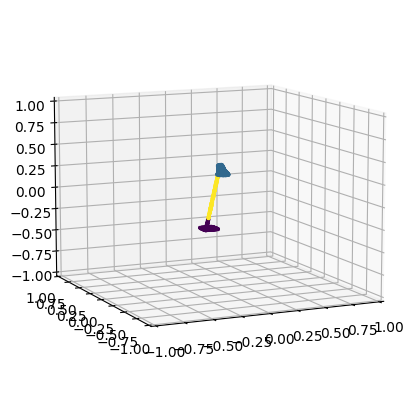

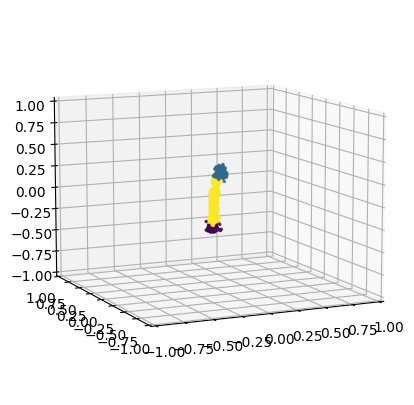

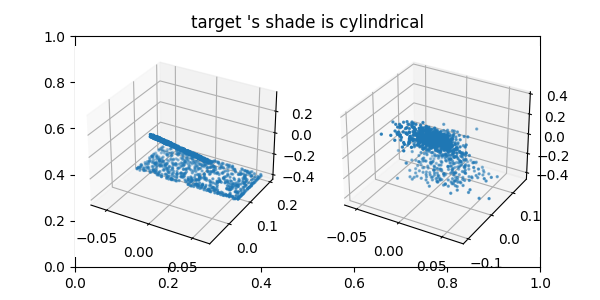

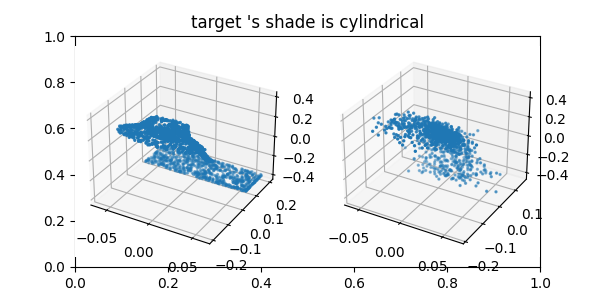

0.0004888081457465887 0.0005903888435780745


In [ ]:
shapes_to_apply_lgd = np.setdiff1d(np.arange(len(input_gt)), ignore_excluding)
print(len(shapes_to_apply_lgd))
#ridx = np.random.choice(shapes_to_apply_lgd)
#print(ridx)
ridx = 608

plot_3d_point_cloud(input_gt[ridx], c=pred_parts_gt[ridx], visualization_pc_axis=[0,2,1]);
plot_3d_point_cloud(input_trans[ridx], c=pred_parts_trans[ridx], visualization_pc_axis=[0,2,1]);

display(visualize_point_clouds_3d_v2([input_gt[ridx][mask_gt_excluding[ridx]],
                                      input_trans[ridx][mask_tr_excluding[ridx]]],
                                     fig_title=np.array(language_used)[idx_per_class][ridx]))

display(visualize_point_clouds_3d_v2([input_gt[ridx],
                                      input_trans[ridx]],
                                     fig_title=np.array(language_used)[idx_per_class][ridx]))

print(float(unmasked_cds[ridx]), masked_cds[ridx])

In [ ]:
# save examples to files


In [ ]:
# OBSERVE in the above image that despite having removing the seat when computing the LGD:
# The LDG is larger! than the naive chamfer? Why?

### Well it is matter of the new density (number of points) the chamfer-based LGD is working with!
## (see also explanation at top-level README of the changeit3d repo)

In [ ]:
# Let's demonstrate more the above explanation!
## Recompute Naive Chamfer with the density (number of points) used by LGD: is it still a smaller distance?

if True:
    mask_gt_excluding_random = np.zeros_like(mask_gt_excluding)  # sub-sample at that lower density the pointclouds
    mask_tr_excluding_random = np.zeros_like(mask_tr_excluding)

    for i, row in enumerate(mask_gt_excluding):
        on_bits = row.sum()
        random_pos = np.random.choice(len(row), on_bits, replace=False)
        mask_gt_excluding_random[i][random_pos] = True

    for i, row in enumerate(mask_tr_excluding):
        on_bits = row.sum()
        random_pos = np.random.choice(len(row), on_bits, replace=False)
        mask_tr_excluding_random[i][random_pos] = True

_, masked_cds = chamfer_dists_on_masked_pointclouds(input_gt, input_trans, mask_gt_excluding_random, mask_tr_excluding_random, bsize=2048, device=device)
torch.cuda.empty_cache()
masked_cd_mu_random = np.mean([mc for c, mc in enumerate(masked_cds) if c not in set(ignore_excluding)])
score = round(masked_cd_mu_random * scale_chamfer_by, 3)


In [ ]:
print(masked_cds[ridx]) # THIS IS BIGGER!

0.0003766650438962315
